In [1]:
using DataFrames
df = DataFrames.readtable("data/01_heights_weights_genders.csv", header=true)

,Gender,Height,Weight
1,Male,73.847017017515,241.893563180437
2,Male,68.7819040458903,162.3104725213
3,Male,74.1101053917849,212.7408555565
4,Male,71.7309784033377,220.042470303077
5,Male,69.8817958611153,206.349800623871
6,Male,67.2530156878065,152.212155757083
7,Male,68.7850812516616,183.927888604031
8,Male,68.3485155115879,167.971110489509
9,Male,67.018949662883,175.92944039571
10,Male,63.4564939783664,156.399676387112


In [2]:
heights = df[:Height]
describe(heights)

Min      54.2631333250971
1st Qu.  63.505620481218955
Median   66.31807008178464
Mean     66.36755975482124
3rd Qu.  69.1742617268347
Max      78.9987423463896
NAs      0
NA%      0.0%


In [4]:
function myMean(arr)
    sum(arr) / length(arr)
end

function myMedian(arr)
    sortedArr = sort(arr)
    arrLen = length(sortedArr)
    if arrLen % 2 == 0
        (sortedArr[arrLen / 2] + sortedArr[(arrLen / 2) + 1]) / 2
    else
        sortedArr[ceil(arrLen / 2)]
    end
end

println("Mean\t", myMean(heights))
println("Median\t", myMedian(heights))
println(mean(heights) - myMean(heights))
println(median(heights) - myMedian(heights))

Mean	66.36755975482124
Median	66.31807008178464
0.0
0.0


In [3]:
println("Min\t", minimum(heights))
println("Max\t", maximum(heights))
println("Range\t", extrema(heights)) #returns a 2-tuple of (min, mx). Equivalent to range() in R
println("Quantiles\t", quantile(heights))
println("Quantiles with custom probabilities\t", quantile(heights, [.0:.2:1]))

Min	54.2631333250971
Max	78.9987423463896
Range	(54.2631333250971,78.9987423463896)
Quantiles	[54.2631333250971,63.505620481218955,66.31807008178464,69.1742617268347,78.9987423463896]
Quantiles with custom probabilities	[54.2631333250971,62.85900650806874,65.19422135566354,67.43537384132316,69.81162000527536,78.9987423463896]


In [5]:
#ways to create R like Seq which are similar to Range in Julia
#http://docs.julialang.org/en/release-0.3/stdlib/base/?highlight=range#Base.range
println([.0:.2:1]) # [min:step:max]
println(linspace(.0, 1, 6)) # linspace(min, max, length)

#Note: results might be different due to rounding errors. Ref: http://stackoverflow.com/questions/21841295/how-do-you-generate-a-regular-non-integer-sequence-in-julia
linspace(.1,1,10)==[0.1:0.1:1] 

[0.0,0.2,0.4,0.6,0.8,1.0]
[0.0,0.2,0.4,0.6,0.8,1.0]


false

In [6]:
#println(var(heights))

function myVar(arr)
    sum((arr - mean(arr)).^2) / (length(arr) - 1)
end
println(myVar(heights) - var(heights))

println([mean(heights) - var(heights), mean(heights) + var(heights)])
println(extrema(heights))

function myStd(arr)
    sqrt(myVar(arr))
end
println(myStd(heights) - std(heights))

println([mean(heights) - std(heights), mean(heights) + std(heights)])
println(extrema(heights))

println([mean(heights) - std(heights), mean(heights) + std(heights)])
println([quantile(heights, 0.25), quantile(heights, 0.75)])

0.0
[51.56408711468047,81.17103239496201]
(54.2631333250971,78.9987423463896)
0.0
[62.52003163404802,70.21508787559448]
(54.2631333250971,78.9987423463896)
[62.52003163404802,70.21508787559448]
[63.505620481218955,69.1742617268347]


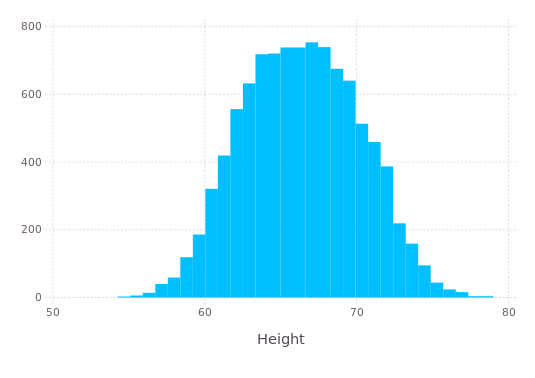

In [7]:
using Gadfly
plot(df, x="Height", Geom.histogram(bincount=30))

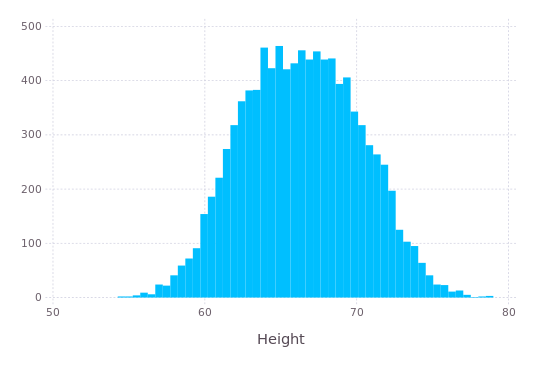

In [8]:
plot(df, x="Height", Geom.histogram(bincount=50))

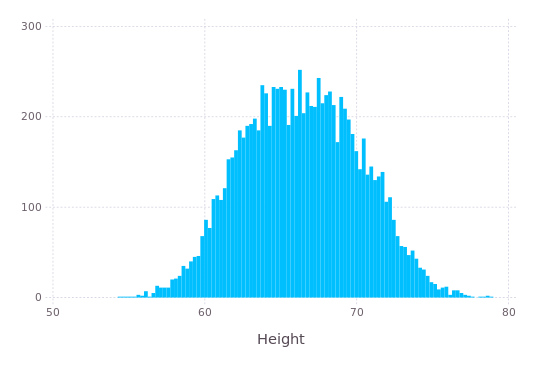

In [9]:
plot(df, x="Height", Geom.histogram(bincount=100))

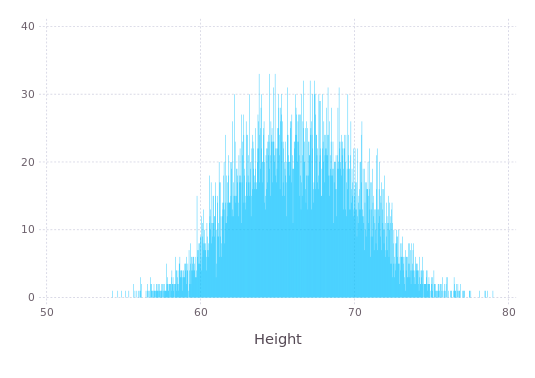

In [10]:
plot(df, x="Height", Geom.histogram(bincount=1000))

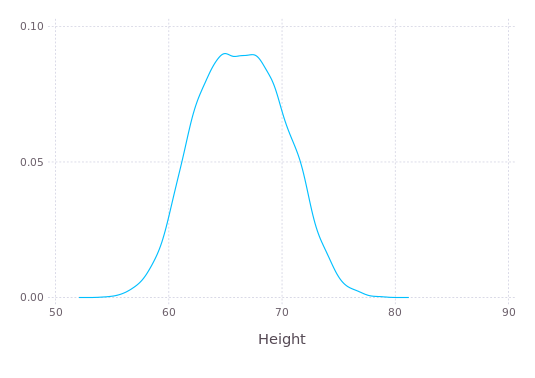

In [11]:
plot(df, x="Height", Geom.density)

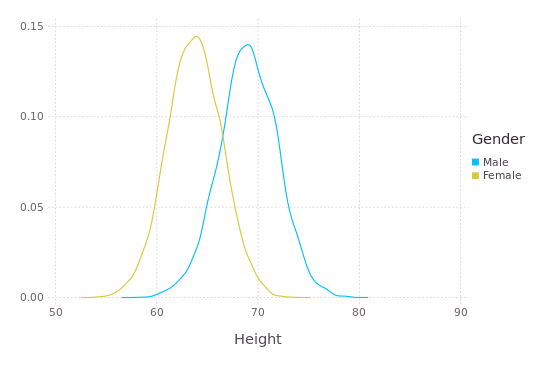

In [12]:
plot(df, x="Height", color="Gender", Geom.density)

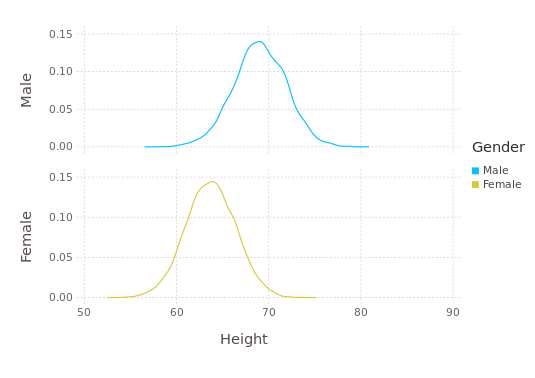

In [13]:
plot(df, ygroup="Gender", x="Height", color="Gender", Geom.subplot_grid(Geom.density))

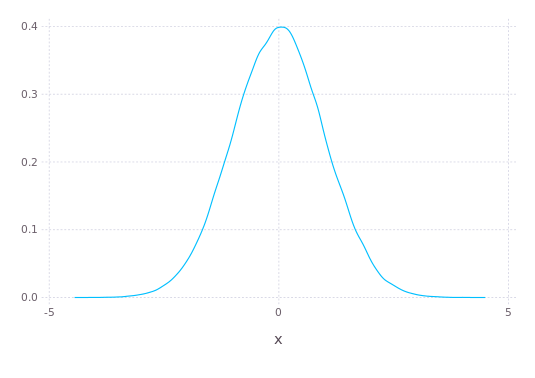

In [14]:
using Distributions
data = rand(Normal(0, 1), 100000)
plot(x=data, Geom.density)

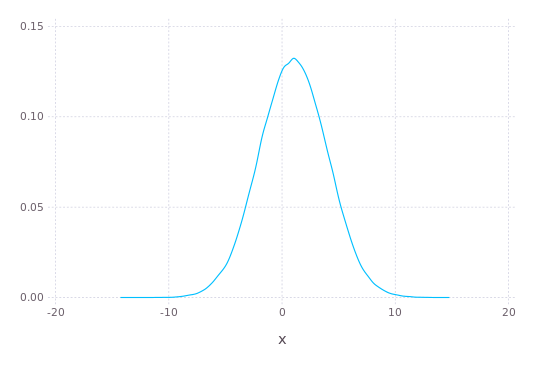

In [15]:
data = rand(Normal(1, 3), 100000)
plot(x=data, Geom.density)

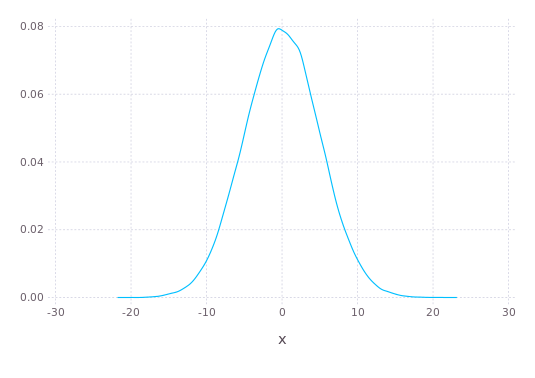

In [16]:
data = rand(Normal(0, 5), 100000)
plot(x=data, Geom.density)

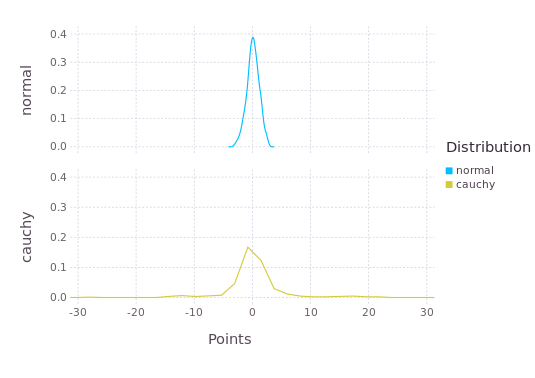

In [17]:
plot(Coord.Cartesian(xmin=-30, xmax=30, ymin=0), 
    layer(x=rand(Normal(0, 1), 250), Geom.density, Theme(default_color=color("red"))),
layer(x=rand(Cauchy(0, 1), 250), Geom.density, Theme(default_color=color("blue"))))

#there might be a better way to do this.
normal = rand(Normal(0, 1), 250)
cauchy = rand(Cauchy(0, 1), 250)
dfDist = DataFrame(Distribution = repeat(["normal", "cauchy"], inner=[250], outer=[1]), Points=cat(1, normal, cauchy))
plot(dfDist, ygroup="Distribution", x="Points", color="Distribution", Geom.subplot_grid(Geom.density, free_x_axis=true, Scale.x_continuous(minvalue=-30, maxvalue=30)))

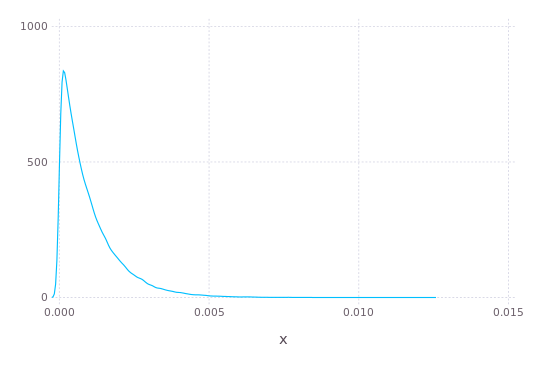

In [19]:
plot(x=rand(Gamma(1,  0.001), 100000), Geom.density, Coord.Cartesian(xmin=0))

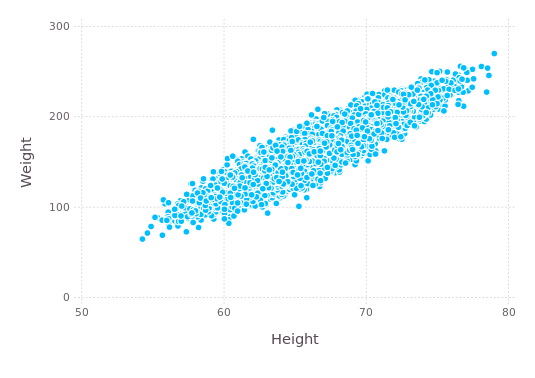

In [20]:
plot(df, x="Height", y="Weight", Geom.point)

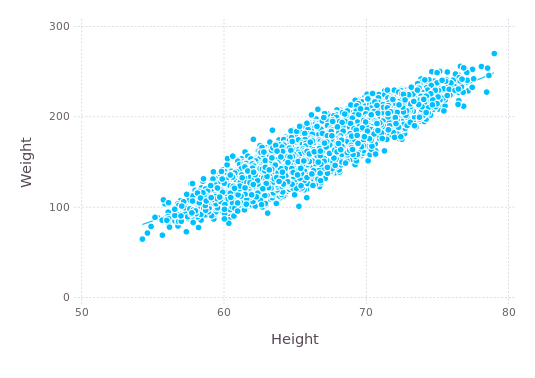

In [21]:
plot(df, x="Height", y="Weight", Geom.point, Geom.smooth)

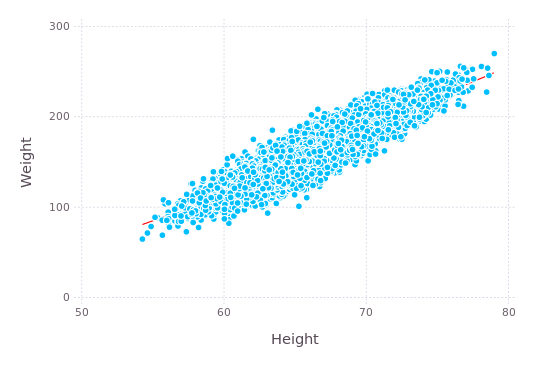

In [22]:
#to change the color of predictor line to make it more noticible
plot(df, x="Height", y="Weight", Geom.point, layer(Geom.smooth, Theme(default_color=color("red"))))

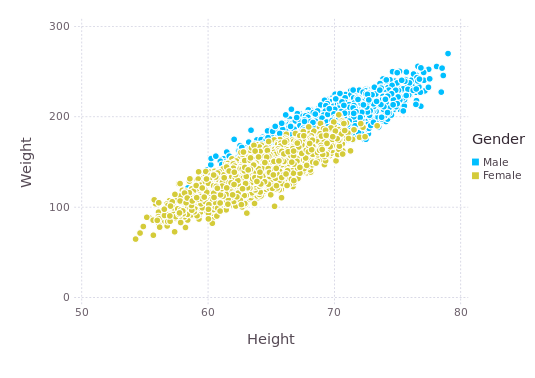

In [23]:
plot(df, x="Height", y="Weight", color="Gender", Geom.point)